In [16]:
# 1. Imports and Setup
# =============================================================

import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from tqdm import tqdm

import random
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader

import albumentations as A
import cv2
import warnings
warnings.filterwarnings("ignore")

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("✅ Using device:", device)

✅ Using device: cuda


In [17]:
# =============================================================
# Imports
# =============================================================
import os
import random
import numpy as np
from PIL import Image

import torch
from torch.utils.data import Dataset, DataLoader

import albumentations as A
from sklearn.model_selection import StratifiedShuffleSplit

# =============================================================
# Config
# =============================================================
base_dir = "/kaggle/input/datasets/maitygouranga/brest-cancer-datasets/monuseg/Brest cancer/MonuSeg/MonuSeg"

train_img_dir = os.path.join(base_dir, "Training", "Images")
train_mask_dir = os.path.join(base_dir, "Training", "Masks")

test_img_dir = os.path.join(base_dir, "Test", "Images")
test_mask_dir = os.path.join(base_dir, "Test", "Masks")

IMG_SIZE   = 256
BATCH_SIZE = 4
SEED       = 42

torch.manual_seed(SEED)
random.seed(SEED)
np.random.seed(SEED)

# =============================================================
# Dataset Class
# =============================================================
class MosMedDataset(Dataset):
    def __init__(self, img_dir, mask_dir, indices=None, transform=None):
        self.img_dir = img_dir
        self.mask_dir = mask_dir
        self.transform = transform

        self.images = sorted(os.listdir(img_dir))
        self.masks  = sorted(os.listdir(mask_dir))

        if indices is not None:
            self.images = [self.images[i] for i in indices]
            self.masks  = [self.masks[i] for i in indices]

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_path  = os.path.join(self.img_dir, self.images[idx])
        mask_path = os.path.join(self.mask_dir, self.masks[idx])

        image = np.array(
            Image.open(img_path).convert("RGB").resize((IMG_SIZE, IMG_SIZE))
        ) / 255.0

        mask = np.array(
            Image.open(mask_path).convert("L").resize((IMG_SIZE, IMG_SIZE))
        ) / 255.0

        mask = (mask > 0.5).astype(np.float32)

        if self.transform:
            augmented = self.transform(image=image, mask=mask)
            image = augmented["image"]
            mask  = augmented["mask"]

        image = torch.tensor(image).permute(2, 0, 1).float()
        mask  = torch.tensor(mask).unsqueeze(0).float()

        return image, mask


# =============================================================
# Augmentations
# =============================================================
train_transform = A.Compose([
    A.Resize(IMG_SIZE, IMG_SIZE),
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.3),
    A.RandomRotate90(p=0.5),
    A.ShiftScaleRotate(
        shift_limit=0.05,
        scale_limit=0.05,
        rotate_limit=15,
        p=0.5
    ),
])

val_transform = A.Compose([
    A.Resize(IMG_SIZE, IMG_SIZE),
])

test_transform = A.Compose([
    A.Resize(IMG_SIZE, IMG_SIZE),
])

# =============================================================
# STRATIFIED TRAIN / VAL SPLIT (SEGMENTATION-CORRECT)
# =============================================================
train_images = sorted(os.listdir(train_img_dir))
train_masks  = sorted(os.listdir(train_mask_dir))
num_train = len(train_images)

# ---- Compute foreground (tumor) ratio per mask ----
foreground_ratios = []

for m in train_masks:
    mask_path = os.path.join(train_mask_dir, m)
    mask = np.array(
        Image.open(mask_path).convert("L").resize((IMG_SIZE, IMG_SIZE))
    ) / 255.0

    mask = (mask > 0.5).astype(np.float32)
    ratio = mask.mean()   # foreground pixel ratio
    foreground_ratios.append(ratio)

foreground_ratios = np.array(foreground_ratios)

# ---- Bin ratios for stratification ----
# 0: almost empty, 1: small tumor, 2: medium, 3: large
bins = np.digitize(
    foreground_ratios,
    bins=[0.01, 0.05, 0.15]
)

indices = np.arange(num_train)

sss = StratifiedShuffleSplit(
    n_splits=1,
    test_size=0.2,
    random_state=SEED
)

train_idx, val_idx = next(
    sss.split(indices, bins)
)

# =============================================================
# Datasets
# =============================================================
train_dataset = MosMedDataset(
    train_img_dir,
    train_mask_dir,
    indices=train_idx,
    transform=train_transform
)

val_dataset = MosMedDataset(
    train_img_dir,
    train_mask_dir,
    indices=val_idx,
    transform=val_transform
)

test_dataset = MosMedDataset(
    test_img_dir,
    test_mask_dir,
    transform=test_transform
)

# =============================================================
# DataLoaders
# =============================================================
train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=2,
    pin_memory=True
)

val_loader = DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=2,
    pin_memory=True
)

test_loader = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=2,
    pin_memory=True
)

# =============================================================
# Sanity Check
# =============================================================
print("✅ Dataset Loaded Successfully!")
print(f"Training images   : {len(train_dataset)}")
print(f"Validation images : {len(val_dataset)}")
print(f"Test images       : {len(test_dataset)}")

✅ Dataset Loaded Successfully!
Training images   : 24
Validation images : 6
Test images       : 14


Apply game theory each layer****

unet

In [18]:
from torchinfo import summary
import torch
import torch.nn as nn
import torch.nn.functional as F


# =============================================================
# 🔷 GATED CHOQUET FUSION (Improved)
# =============================================================
class GatedChoquetFusion(nn.Module):
    def __init__(self, ch):
        super().__init__()

        self.gate = nn.Sequential(
            nn.Conv2d(ch * 2, ch, 1),
            nn.ReLU(inplace=True),
            nn.Conv2d(ch, 2, 1),
            nn.Sigmoid()
        )

    def forward(self, inputs):
        x1, x2 = inputs

        stacked = torch.stack([x1, x2], dim=0)
        sorted_vals, _ = torch.sort(stacked, dim=0)

        g = self.gate(torch.cat([x1, x2], dim=1))
        g1, g2 = g[:, 0:1], g[:, 1:2]

        return g1 * sorted_vals[0] + g2 * sorted_vals[1]


# =============================================================
# 🔷 EDGE ENHANCER
# =============================================================
class EdgeEnhancer(nn.Module):
    def __init__(self, ch):
        super().__init__()
        self.conv = nn.Conv2d(ch, ch, 3, padding=1)

    def forward(self, x):
        edge = x - F.avg_pool2d(x, 3, stride=1, padding=1)
        return x + self.conv(edge)


# =============================================================
# 🔷 CROSS ATTENTION
# =============================================================
class CrossAttention(nn.Module):
    def __init__(self, ch):
        super().__init__()
        self.q = nn.Conv2d(ch, ch, 1)
        self.k = nn.Conv2d(ch, ch, 1)
        self.v = nn.Conv2d(ch, ch, 1)

    def forward(self, dec, enc):
        q = self.q(dec)
        k = self.k(enc)
        v = self.v(enc)

        attn = torch.softmax(q * k, dim=1)
        return dec + attn * v


# =============================================================
# 🔷 CHANNEL ATTENTION (CAM)
# =============================================================
class CAM(nn.Module):
    def __init__(self, ch, reduction=8):
        super().__init__()
        self.pool = nn.AdaptiveAvgPool2d(1)
        self.fc = nn.Sequential(
            nn.Conv2d(ch, ch // reduction, 1),
            nn.ReLU(inplace=True),
            nn.Conv2d(ch // reduction, ch, 1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return x * self.fc(self.pool(x))


# =============================================================
# 🔷 SPATIAL ATTENTION (SAM)
# =============================================================
class SAM(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv = nn.Conv2d(2, 1, 7, padding=3)

    def forward(self, x):
        avg = torch.mean(x, dim=1, keepdim=True)
        maxv, _ = torch.max(x, dim=1, keepdim=True)
        return x * torch.sigmoid(self.conv(torch.cat([avg, maxv], dim=1)))


# =============================================================
# 🔥 SIMPLE CONV BLOCK (REPLACES DACC)
# =============================================================
class ConvBlock(nn.Module):
    def __init__(self, in_ch, out_ch):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 3, padding=1),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_ch, out_ch, 3, padding=1),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True)
        )

        self.cam = CAM(out_ch)
        self.sam = SAM()

    def forward(self, x):
        x = self.block(x)
        x = self.cam(x)
        x = self.sam(x)
        return x


# =============================================================
# 🔥 FINAL U-NET (NO DACC)
# =============================================================
class UNetSegmentation(nn.Module):
    def __init__(self, in_ch=3, out_ch=1):
        super().__init__()

        self.pool = nn.MaxPool2d(2)

        # Encoder
        self.e1 = ConvBlock(in_ch, 64)
        self.e2 = ConvBlock(64, 128)
        self.e3 = ConvBlock(128, 256)
        self.e4 = ConvBlock(256, 512)

        # Edge Enhancers
        self.edge1 = EdgeEnhancer(64)
        self.edge2 = EdgeEnhancer(128)
        self.edge3 = EdgeEnhancer(256)
        self.edge4 = EdgeEnhancer(512)

        # Bottleneck
        self.bottleneck = ConvBlock(512, 1024)

        # Cross Attention
        self.cross4 = CrossAttention(512)
        self.cross3 = CrossAttention(256)
        self.cross2 = CrossAttention(128)
        self.cross1 = CrossAttention(64)

        # Choquet
        self.cf4 = GatedChoquetFusion(512)
        self.cf3 = GatedChoquetFusion(256)
        self.cf2 = GatedChoquetFusion(128)
        self.cf1 = GatedChoquetFusion(64)

        # Decoder
        self.up4 = nn.ConvTranspose2d(1024, 512, 2, 2)
        self.d4 = ConvBlock(512, 512)

        self.up3 = nn.ConvTranspose2d(512, 256, 2, 2)
        self.d3 = ConvBlock(256, 256)

        self.up2 = nn.ConvTranspose2d(256, 128, 2, 2)
        self.d2 = ConvBlock(128, 128)

        self.up1 = nn.ConvTranspose2d(128, 64, 2, 2)
        self.d1 = ConvBlock(64, 64)

        self.final = nn.Conv2d(64, out_ch, 1)

    def forward(self, x):

        # Encoder
        e1 = self.edge1(self.e1(x))
        e2 = self.edge2(self.e2(self.pool(e1)))
        e3 = self.edge3(self.e3(self.pool(e2)))
        e4 = self.edge4(self.e4(self.pool(e3)))

        # Bottleneck
        b = self.bottleneck(self.pool(e4))

        # Decoder
        d4 = self.up4(b)
        d4 = self.cross4(d4, e4)
        d4 = self.cf4([d4, e4])
        d4 = self.d4(d4)

        d3 = self.up3(d4)
        d3 = self.cross3(d3, e3)
        d3 = self.cf3([d3, e3])
        d3 = self.d3(d3)

        d2 = self.up2(d3)
        d2 = self.cross2(d2, e2)
        d2 = self.cf2([d2, e2])
        d2 = self.d2(d2)

        d1 = self.up1(d2)
        d1 = self.cross1(d1, e1)
        d1 = self.cf1([d1, e1])
        d1 = self.d1(d1)

        return torch.sigmoid(self.final(d1))


# =============================================================
# TEST
# =============================================================
if __name__ == "__main__":
    model = UNetSegmentation().cuda()
    x = torch.randn(4, 3, 256, 256).cuda()
    y = model(x)

    print("Output:", y.shape)
    print("\n================= MODEL SUMMARY =================\n")
    print(summary(model, input_size=(4, 3, 256, 256)))

Output: torch.Size([4, 1, 256, 256])

================= MODEL SUMMARY =================

Layer (type:depth-idx)                   Output Shape              Param #
UNetSegmentation                         [4, 1, 256, 256]          --
├─ConvBlock: 1-1                         [4, 64, 256, 256]         --
│    └─Sequential: 2-1                   [4, 64, 256, 256]         --
│    │    └─Conv2d: 3-1                  [4, 64, 256, 256]         1,792
│    │    └─BatchNorm2d: 3-2             [4, 64, 256, 256]         128
│    │    └─ReLU: 3-3                    [4, 64, 256, 256]         --
│    │    └─Conv2d: 3-4                  [4, 64, 256, 256]         36,928
│    │    └─BatchNorm2d: 3-5             [4, 64, 256, 256]         128
│    │    └─ReLU: 3-6                    [4, 64, 256, 256]         --
│    └─CAM: 2-2                          [4, 64, 256, 256]         --
│    │    └─AdaptiveAvgPool2d: 3-7       [4, 64, 1, 1]             --
│    │    └─Sequential: 3-8              [4, 64, 1, 1]   

Epoch 1/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.21it/s]



Epoch 1/100
LR: 0.000100
Train Loss: 0.6781 | Val Loss: 0.6967
Train Dice: 0.3582 | Val Dice: 0.3097
Train IoU : 0.2925 | Val IoU : 0.2235
✅ Best model saved (Epoch 1, Val Loss 0.6967)


Epoch 2/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.21it/s]



Epoch 2/100
LR: 0.000100
Train Loss: 0.6325 | Val Loss: 0.6988
Train Dice: 0.3966 | Val Dice: 0.3110
Train IoU : 0.3795 | Val IoU : 0.2235


Epoch 3/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.24it/s]



Epoch 3/100
LR: 0.000100
Train Loss: 0.6000 | Val Loss: 0.6995
Train Dice: 0.4256 | Val Dice: 0.3133
Train IoU : 0.4171 | Val IoU : 0.2235


Epoch 4/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.22it/s]



Epoch 4/100
LR: 0.000100
Train Loss: 0.5794 | Val Loss: 0.6975
Train Dice: 0.4431 | Val Dice: 0.3175
Train IoU : 0.4535 | Val IoU : 0.2235


Epoch 5/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.24it/s]



Epoch 5/100
LR: 0.000100
Train Loss: 0.5662 | Val Loss: 0.6915
Train Dice: 0.4535 | Val Dice: 0.3260
Train IoU : 0.4846 | Val IoU : 0.2242
✅ Best model saved (Epoch 5, Val Loss 0.6915)


Epoch 6/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.24it/s]



Epoch 6/100
LR: 0.000100
Train Loss: 0.5548 | Val Loss: 0.6794
Train Dice: 0.4634 | Val Dice: 0.3420
Train IoU : 0.4997 | Val IoU : 0.2610
✅ Best model saved (Epoch 6, Val Loss 0.6794)


Epoch 7/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.23it/s]



Epoch 7/100
LR: 0.000100
Train Loss: 0.5469 | Val Loss: 0.6653
Train Dice: 0.4700 | Val Dice: 0.3648
Train IoU : 0.5184 | Val IoU : 0.2782
✅ Best model saved (Epoch 7, Val Loss 0.6653)


Epoch 8/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.24it/s]



Epoch 8/100
LR: 0.000100
Train Loss: 0.5417 | Val Loss: 0.6441
Train Dice: 0.4732 | Val Dice: 0.3970
Train IoU : 0.5289 | Val IoU : 0.3103
✅ Best model saved (Epoch 8, Val Loss 0.6441)


Epoch 9/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.26it/s]



Epoch 9/100
LR: 0.000100
Train Loss: 0.5321 | Val Loss: 0.6069
Train Dice: 0.4830 | Val Dice: 0.4238
Train IoU : 0.5404 | Val IoU : 0.3897
✅ Best model saved (Epoch 9, Val Loss 0.6069)


Epoch 10/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.22it/s]



Epoch 10/100
LR: 0.000100
Train Loss: 0.5217 | Val Loss: 0.5882
Train Dice: 0.4919 | Val Dice: 0.4382
Train IoU : 0.5602 | Val IoU : 0.4329
✅ Best model saved (Epoch 10, Val Loss 0.5882)


Epoch 11/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.18it/s]



Epoch 11/100
LR: 0.000100
Train Loss: 0.5195 | Val Loss: 0.5638
Train Dice: 0.4936 | Val Dice: 0.4494
Train IoU : 0.5657 | Val IoU : 0.4911
✅ Best model saved (Epoch 11, Val Loss 0.5638)


Epoch 12/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.25it/s]



Epoch 12/100
LR: 0.000100
Train Loss: 0.5144 | Val Loss: 0.5537
Train Dice: 0.4993 | Val Dice: 0.4651
Train IoU : 0.5740 | Val IoU : 0.4916
✅ Best model saved (Epoch 12, Val Loss 0.5537)


Epoch 13/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.27it/s]



Epoch 13/100
LR: 0.000100
Train Loss: 0.5102 | Val Loss: 0.5492
Train Dice: 0.5032 | Val Dice: 0.4676
Train IoU : 0.5731 | Val IoU : 0.4970
✅ Best model saved (Epoch 13, Val Loss 0.5492)


Epoch 14/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.28it/s]



Epoch 14/100
LR: 0.000100
Train Loss: 0.5085 | Val Loss: 0.5370
Train Dice: 0.5037 | Val Dice: 0.4772
Train IoU : 0.5729 | Val IoU : 0.5203
✅ Best model saved (Epoch 14, Val Loss 0.5370)


Epoch 15/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.18it/s]



Epoch 15/100
LR: 0.000100
Train Loss: 0.5011 | Val Loss: 0.5313
Train Dice: 0.5094 | Val Dice: 0.4729
Train IoU : 0.5856 | Val IoU : 0.5438
✅ Best model saved (Epoch 15, Val Loss 0.5313)


Epoch 16/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.30it/s]



Epoch 16/100
LR: 0.000100
Train Loss: 0.4969 | Val Loss: 0.5415
Train Dice: 0.5137 | Val Dice: 0.4844
Train IoU : 0.5876 | Val IoU : 0.4939


Epoch 17/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.26it/s]



Epoch 17/100
LR: 0.000100
Train Loss: 0.4908 | Val Loss: 0.5438
Train Dice: 0.5191 | Val Dice: 0.4819
Train IoU : 0.5937 | Val IoU : 0.4925


Epoch 18/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.22it/s]



Epoch 18/100
LR: 0.000100
Train Loss: 0.4912 | Val Loss: 0.5273
Train Dice: 0.5190 | Val Dice: 0.4839
Train IoU : 0.5910 | Val IoU : 0.5379
✅ Best model saved (Epoch 18, Val Loss 0.5273)


Epoch 19/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.16it/s]



Epoch 19/100
LR: 0.000100
Train Loss: 0.4844 | Val Loss: 0.5312
Train Dice: 0.5245 | Val Dice: 0.4981
Train IoU : 0.6011 | Val IoU : 0.5046


Epoch 20/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.19it/s]



Epoch 20/100
LR: 0.000100
Train Loss: 0.4803 | Val Loss: 0.4978
Train Dice: 0.5284 | Val Dice: 0.4981
Train IoU : 0.6053 | Val IoU : 0.5792
✅ Best model saved (Epoch 20, Val Loss 0.4978)


Epoch 21/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.21it/s]



Epoch 21/100
LR: 0.000100
Train Loss: 0.4778 | Val Loss: 0.5224
Train Dice: 0.5295 | Val Dice: 0.4947
Train IoU : 0.5990 | Val IoU : 0.5316


Epoch 22/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.23it/s]



Epoch 22/100
LR: 0.000100
Train Loss: 0.4714 | Val Loss: 0.5210
Train Dice: 0.5351 | Val Dice: 0.5008
Train IoU : 0.6133 | Val IoU : 0.5241


Epoch 23/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.24it/s]



Epoch 23/100
LR: 0.000100
Train Loss: 0.4689 | Val Loss: 0.5012
Train Dice: 0.5371 | Val Dice: 0.4967
Train IoU : 0.6120 | Val IoU : 0.5782


Epoch 24/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.28it/s]



Epoch 24/100
LR: 0.000100
Train Loss: 0.4699 | Val Loss: 0.5293
Train Dice: 0.5353 | Val Dice: 0.5055
Train IoU : 0.6039 | Val IoU : 0.5037


Epoch 25/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.23it/s]



Epoch 25/100
LR: 0.000100
Train Loss: 0.4634 | Val Loss: 0.5035
Train Dice: 0.5410 | Val Dice: 0.5083
Train IoU : 0.6163 | Val IoU : 0.5508


Epoch 26/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.30it/s]



Epoch 26/100
LR: 0.000100
Train Loss: 0.4588 | Val Loss: 0.4918
Train Dice: 0.5463 | Val Dice: 0.5159
Train IoU : 0.6199 | Val IoU : 0.5668
✅ Best model saved (Epoch 26, Val Loss 0.4918)


Epoch 27/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.25it/s]



Epoch 27/100
LR: 0.000100
Train Loss: 0.4583 | Val Loss: 0.4823
Train Dice: 0.5452 | Val Dice: 0.5160
Train IoU : 0.6176 | Val IoU : 0.5880
✅ Best model saved (Epoch 27, Val Loss 0.4823)


Epoch 28/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.23it/s]



Epoch 28/100
LR: 0.000100
Train Loss: 0.4604 | Val Loss: 0.4784
Train Dice: 0.5414 | Val Dice: 0.5179
Train IoU : 0.6085 | Val IoU : 0.5922
✅ Best model saved (Epoch 28, Val Loss 0.4784)


Epoch 29/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.25it/s]



Epoch 29/100
LR: 0.000100
Train Loss: 0.4556 | Val Loss: 0.4823
Train Dice: 0.5464 | Val Dice: 0.5181
Train IoU : 0.6162 | Val IoU : 0.5801


Epoch 30/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.25it/s]



Epoch 30/100
LR: 0.000100
Train Loss: 0.4542 | Val Loss: 0.4864
Train Dice: 0.5474 | Val Dice: 0.5374
Train IoU : 0.6142 | Val IoU : 0.5557


Epoch 31/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.25it/s]



Epoch 31/100
LR: 0.000100
Train Loss: 0.4454 | Val Loss: 0.4779
Train Dice: 0.5551 | Val Dice: 0.5290
Train IoU : 0.6312 | Val IoU : 0.5806
✅ Best model saved (Epoch 31, Val Loss 0.4779)


Epoch 32/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.18it/s]



Epoch 32/100
LR: 0.000100
Train Loss: 0.4391 | Val Loss: 0.4718
Train Dice: 0.5606 | Val Dice: 0.5314
Train IoU : 0.6399 | Val IoU : 0.5835
✅ Best model saved (Epoch 32, Val Loss 0.4718)


Epoch 33/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.28it/s]



Epoch 33/100
LR: 0.000100
Train Loss: 0.4408 | Val Loss: 0.4693
Train Dice: 0.5587 | Val Dice: 0.5402
Train IoU : 0.6276 | Val IoU : 0.5770
✅ Best model saved (Epoch 33, Val Loss 0.4693)


Epoch 34/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.28it/s]



Epoch 34/100
LR: 0.000100
Train Loss: 0.4362 | Val Loss: 0.4622
Train Dice: 0.5629 | Val Dice: 0.5341
Train IoU : 0.6383 | Val IoU : 0.6001
✅ Best model saved (Epoch 34, Val Loss 0.4622)


Epoch 35/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.22it/s]



Epoch 35/100
LR: 0.000100
Train Loss: 0.4344 | Val Loss: 0.4392
Train Dice: 0.5664 | Val Dice: 0.5247
Train IoU : 0.6350 | Val IoU : 0.6413
✅ Best model saved (Epoch 35, Val Loss 0.4392)


Epoch 36/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.25it/s]



Epoch 36/100
LR: 0.000100
Train Loss: 0.4315 | Val Loss: 0.4507
Train Dice: 0.5689 | Val Dice: 0.5249
Train IoU : 0.6361 | Val IoU : 0.6221


Epoch 37/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.24it/s]



Epoch 37/100
LR: 0.000100
Train Loss: 0.4309 | Val Loss: 0.4809
Train Dice: 0.5665 | Val Dice: 0.5337
Train IoU : 0.6349 | Val IoU : 0.5638


Epoch 38/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.26it/s]



Epoch 38/100
LR: 0.000100
Train Loss: 0.4223 | Val Loss: 0.4856
Train Dice: 0.5757 | Val Dice: 0.5383
Train IoU : 0.6460 | Val IoU : 0.5552


Epoch 39/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.30it/s]



Epoch 39/100
LR: 0.000100
Train Loss: 0.4210 | Val Loss: 0.4502
Train Dice: 0.5762 | Val Dice: 0.5474
Train IoU : 0.6473 | Val IoU : 0.6112


Epoch 40/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.29it/s]



Epoch 40/100
LR: 0.000100
Train Loss: 0.4188 | Val Loss: 0.4619
Train Dice: 0.5765 | Val Dice: 0.5443
Train IoU : 0.6509 | Val IoU : 0.5973


Epoch 41/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.23it/s]



Epoch 41/100
LR: 0.000100
Train Loss: 0.4146 | Val Loss: 0.4692
Train Dice: 0.5811 | Val Dice: 0.5538
Train IoU : 0.6502 | Val IoU : 0.5679


Epoch 42/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.23it/s]



Epoch 42/100
LR: 0.000100
Train Loss: 0.4122 | Val Loss: 0.4728
Train Dice: 0.5833 | Val Dice: 0.5523
Train IoU : 0.6540 | Val IoU : 0.5622


Epoch 43/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.23it/s]



Epoch 43/100
LR: 0.000100
Train Loss: 0.4114 | Val Loss: 0.4355
Train Dice: 0.5844 | Val Dice: 0.5514
Train IoU : 0.6494 | Val IoU : 0.6221
✅ Best model saved (Epoch 43, Val Loss 0.4355)


Epoch 44/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.19it/s]



Epoch 44/100
LR: 0.000100
Train Loss: 0.4121 | Val Loss: 0.4526
Train Dice: 0.5832 | Val Dice: 0.5592
Train IoU : 0.6450 | Val IoU : 0.5889


Epoch 45/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.23it/s]



Epoch 45/100
LR: 0.000100
Train Loss: 0.4032 | Val Loss: 0.4375
Train Dice: 0.5919 | Val Dice: 0.5622
Train IoU : 0.6575 | Val IoU : 0.6037


Epoch 46/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.23it/s]



Epoch 46/100
LR: 0.000100
Train Loss: 0.3985 | Val Loss: 0.4253
Train Dice: 0.5958 | Val Dice: 0.5668
Train IoU : 0.6620 | Val IoU : 0.6250
✅ Best model saved (Epoch 46, Val Loss 0.4253)


Epoch 47/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.19it/s]



Epoch 47/100
LR: 0.000100
Train Loss: 0.4010 | Val Loss: 0.4234
Train Dice: 0.5922 | Val Dice: 0.5613
Train IoU : 0.6552 | Val IoU : 0.6448
✅ Best model saved (Epoch 47, Val Loss 0.4234)


Epoch 48/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.16it/s]



Epoch 48/100
LR: 0.000100
Train Loss: 0.4019 | Val Loss: 0.4510
Train Dice: 0.5916 | Val Dice: 0.5660
Train IoU : 0.6510 | Val IoU : 0.5814


Epoch 49/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.24it/s]



Epoch 49/100
LR: 0.000100
Train Loss: 0.3960 | Val Loss: 0.4286
Train Dice: 0.5966 | Val Dice: 0.5626
Train IoU : 0.6578 | Val IoU : 0.6143


Epoch 50/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.20it/s]



Epoch 50/100
LR: 0.000100
Train Loss: 0.3994 | Val Loss: 0.4163
Train Dice: 0.5954 | Val Dice: 0.5781
Train IoU : 0.6450 | Val IoU : 0.6233
✅ Best model saved (Epoch 50, Val Loss 0.4163)


Epoch 51/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.25it/s]



Epoch 51/100
LR: 0.000100
Train Loss: 0.3926 | Val Loss: 0.4245
Train Dice: 0.5985 | Val Dice: 0.5742
Train IoU : 0.6594 | Val IoU : 0.6198


Epoch 52/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.23it/s]



Epoch 52/100
LR: 0.000100
Train Loss: 0.3904 | Val Loss: 0.4351
Train Dice: 0.6010 | Val Dice: 0.5729
Train IoU : 0.6580 | Val IoU : 0.6011


Epoch 53/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.23it/s]



Epoch 53/100
LR: 0.000100
Train Loss: 0.3836 | Val Loss: 0.4394
Train Dice: 0.6074 | Val Dice: 0.5747
Train IoU : 0.6686 | Val IoU : 0.5956


Epoch 54/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.17it/s]



Epoch 54/100
LR: 0.000100
Train Loss: 0.3834 | Val Loss: 0.4240
Train Dice: 0.6069 | Val Dice: 0.5769
Train IoU : 0.6639 | Val IoU : 0.6184


Epoch 55/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.21it/s]



Epoch 55/100
LR: 0.000100
Train Loss: 0.3794 | Val Loss: 0.4297
Train Dice: 0.6116 | Val Dice: 0.5799
Train IoU : 0.6657 | Val IoU : 0.6001


Epoch 56/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.18it/s]



Epoch 56/100
LR: 0.000100
Train Loss: 0.3746 | Val Loss: 0.4365
Train Dice: 0.6142 | Val Dice: 0.5789
Train IoU : 0.6722 | Val IoU : 0.6013


Epoch 57/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.21it/s]



Epoch 57/100
LR: 0.000100
Train Loss: 0.3724 | Val Loss: 0.4345
Train Dice: 0.6163 | Val Dice: 0.5767
Train IoU : 0.6760 | Val IoU : 0.5956


Epoch 58/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.26it/s]



Epoch 58/100
LR: 0.000100
Train Loss: 0.3739 | Val Loss: 0.4098
Train Dice: 0.6177 | Val Dice: 0.5860
Train IoU : 0.6651 | Val IoU : 0.6230
✅ Best model saved (Epoch 58, Val Loss 0.4098)


Epoch 59/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.22it/s]



Epoch 59/100
LR: 0.000100
Train Loss: 0.3724 | Val Loss: 0.4061
Train Dice: 0.6166 | Val Dice: 0.5876
Train IoU : 0.6673 | Val IoU : 0.6354
✅ Best model saved (Epoch 59, Val Loss 0.4061)


Epoch 60/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.23it/s]



Epoch 60/100
LR: 0.000100
Train Loss: 0.3647 | Val Loss: 0.4051
Train Dice: 0.6231 | Val Dice: 0.5940
Train IoU : 0.6804 | Val IoU : 0.6220
✅ Best model saved (Epoch 60, Val Loss 0.4051)


Epoch 61/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.21it/s]



Epoch 61/100
LR: 0.000100
Train Loss: 0.3681 | Val Loss: 0.4035
Train Dice: 0.6214 | Val Dice: 0.5908
Train IoU : 0.6703 | Val IoU : 0.6279
✅ Best model saved (Epoch 61, Val Loss 0.4035)


Epoch 62/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.29it/s]



Epoch 62/100
LR: 0.000100
Train Loss: 0.3687 | Val Loss: 0.4039
Train Dice: 0.6195 | Val Dice: 0.5897
Train IoU : 0.6652 | Val IoU : 0.6302


Epoch 63/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.34it/s]



Epoch 63/100
LR: 0.000100
Train Loss: 0.3646 | Val Loss: 0.3850
Train Dice: 0.6227 | Val Dice: 0.6000
Train IoU : 0.6717 | Val IoU : 0.6434
✅ Best model saved (Epoch 63, Val Loss 0.3850)


Epoch 64/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.18it/s]



Epoch 64/100
LR: 0.000100
Train Loss: 0.3586 | Val Loss: 0.3826
Train Dice: 0.6288 | Val Dice: 0.5975
Train IoU : 0.6766 | Val IoU : 0.6467
✅ Best model saved (Epoch 64, Val Loss 0.3826)


Epoch 65/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.24it/s]



Epoch 65/100
LR: 0.000100
Train Loss: 0.3624 | Val Loss: 0.3940
Train Dice: 0.6249 | Val Dice: 0.5956
Train IoU : 0.6638 | Val IoU : 0.6383


Epoch 66/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.22it/s]



Epoch 66/100
LR: 0.000100
Train Loss: 0.3572 | Val Loss: 0.3945
Train Dice: 0.6286 | Val Dice: 0.6023
Train IoU : 0.6739 | Val IoU : 0.6335


Epoch 67/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.26it/s]



Epoch 67/100
LR: 0.000100
Train Loss: 0.3509 | Val Loss: 0.3770
Train Dice: 0.6350 | Val Dice: 0.6008
Train IoU : 0.6814 | Val IoU : 0.6575
✅ Best model saved (Epoch 67, Val Loss 0.3770)


Epoch 68/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.21it/s]



Epoch 68/100
LR: 0.000100
Train Loss: 0.3454 | Val Loss: 0.3890
Train Dice: 0.6400 | Val Dice: 0.6032
Train IoU : 0.6867 | Val IoU : 0.6347


Epoch 69/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.25it/s]



Epoch 69/100
LR: 0.000100
Train Loss: 0.3405 | Val Loss: 0.3898
Train Dice: 0.6451 | Val Dice: 0.6015
Train IoU : 0.6934 | Val IoU : 0.6350


Epoch 70/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.28it/s]



Epoch 70/100
LR: 0.000100
Train Loss: 0.3447 | Val Loss: 0.3755
Train Dice: 0.6410 | Val Dice: 0.6115
Train IoU : 0.6805 | Val IoU : 0.6497
✅ Best model saved (Epoch 70, Val Loss 0.3755)


Epoch 71/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.16it/s]



Epoch 71/100
LR: 0.000100
Train Loss: 0.3349 | Val Loss: 0.4016
Train Dice: 0.6505 | Val Dice: 0.6055
Train IoU : 0.6948 | Val IoU : 0.6114


Epoch 72/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.24it/s]



Epoch 72/100
LR: 0.000100
Train Loss: 0.3443 | Val Loss: 0.3585
Train Dice: 0.6413 | Val Dice: 0.6094
Train IoU : 0.6778 | Val IoU : 0.6651
✅ Best model saved (Epoch 72, Val Loss 0.3585)


Epoch 73/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.24it/s]



Epoch 73/100
LR: 0.000100
Train Loss: 0.3368 | Val Loss: 0.3698
Train Dice: 0.6479 | Val Dice: 0.6121
Train IoU : 0.6869 | Val IoU : 0.6481


Epoch 74/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.27it/s]



Epoch 74/100
LR: 0.000100
Train Loss: 0.3408 | Val Loss: 0.3616
Train Dice: 0.6461 | Val Dice: 0.6199
Train IoU : 0.6751 | Val IoU : 0.6535


Epoch 75/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.21it/s]



Epoch 75/100
LR: 0.000100
Train Loss: 0.3352 | Val Loss: 0.3745
Train Dice: 0.6493 | Val Dice: 0.6200
Train IoU : 0.6817 | Val IoU : 0.6402


Epoch 76/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.20it/s]



Epoch 76/100
LR: 0.000100
Train Loss: 0.3313 | Val Loss: 0.3635
Train Dice: 0.6531 | Val Dice: 0.6218
Train IoU : 0.6868 | Val IoU : 0.6531


Epoch 77/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.20it/s]



Epoch 77/100
LR: 0.000100
Train Loss: 0.3276 | Val Loss: 0.3898
Train Dice: 0.6556 | Val Dice: 0.6190
Train IoU : 0.6927 | Val IoU : 0.6186


Epoch 78/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.23it/s]



Epoch 78/100
LR: 0.000100
Train Loss: 0.3263 | Val Loss: 0.3528
Train Dice: 0.6573 | Val Dice: 0.6214
Train IoU : 0.6904 | Val IoU : 0.6633
✅ Best model saved (Epoch 78, Val Loss 0.3528)


Epoch 79/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.23it/s]



Epoch 79/100
LR: 0.000100
Train Loss: 0.3176 | Val Loss: 0.3554
Train Dice: 0.6661 | Val Dice: 0.6300
Train IoU : 0.7015 | Val IoU : 0.6515


Epoch 80/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.22it/s]



Epoch 80/100
LR: 0.000100
Train Loss: 0.3163 | Val Loss: 0.3747
Train Dice: 0.6686 | Val Dice: 0.6227
Train IoU : 0.7005 | Val IoU : 0.6321


Epoch 81/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.19it/s]



Epoch 81/100
LR: 0.000100
Train Loss: 0.3250 | Val Loss: 0.3678
Train Dice: 0.6609 | Val Dice: 0.6249
Train IoU : 0.6833 | Val IoU : 0.6406


Epoch 82/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.24it/s]



Epoch 82/100
LR: 0.000100
Train Loss: 0.3199 | Val Loss: 0.3414
Train Dice: 0.6633 | Val Dice: 0.6259
Train IoU : 0.6920 | Val IoU : 0.6702
✅ Best model saved (Epoch 82, Val Loss 0.3414)


Epoch 83/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.22it/s]



Epoch 83/100
LR: 0.000100
Train Loss: 0.3125 | Val Loss: 0.3607
Train Dice: 0.6691 | Val Dice: 0.6312
Train IoU : 0.7020 | Val IoU : 0.6469


Epoch 84/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.23it/s]



Epoch 84/100
LR: 0.000100
Train Loss: 0.3109 | Val Loss: 0.3580
Train Dice: 0.6703 | Val Dice: 0.6350
Train IoU : 0.7028 | Val IoU : 0.6460


Epoch 85/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.28it/s]



Epoch 85/100
LR: 0.000100
Train Loss: 0.3086 | Val Loss: 0.3533
Train Dice: 0.6747 | Val Dice: 0.6357
Train IoU : 0.7019 | Val IoU : 0.6503


Epoch 86/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.22it/s]



Epoch 86/100
LR: 0.000100
Train Loss: 0.3135 | Val Loss: 0.3549
Train Dice: 0.6712 | Val Dice: 0.6432
Train IoU : 0.6901 | Val IoU : 0.6426


Epoch 87/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.22it/s]



Epoch 87/100
LR: 0.000100
Train Loss: 0.3041 | Val Loss: 0.3609
Train Dice: 0.6791 | Val Dice: 0.6411
Train IoU : 0.7030 | Val IoU : 0.6390


Epoch 88/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.22it/s]



Epoch 88/100
LR: 0.000100
Train Loss: 0.3019 | Val Loss: 0.3867
Train Dice: 0.6786 | Val Dice: 0.6336
Train IoU : 0.7055 | Val IoU : 0.6140


Epoch 89/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.24it/s]



Epoch 89/100
LR: 0.000100
Train Loss: 0.3004 | Val Loss: 0.3278
Train Dice: 0.6833 | Val Dice: 0.6454
Train IoU : 0.7052 | Val IoU : 0.6711
✅ Best model saved (Epoch 89, Val Loss 0.3278)


Epoch 90/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.16it/s]



Epoch 90/100
LR: 0.000100
Train Loss: 0.2998 | Val Loss: 0.3428
Train Dice: 0.6848 | Val Dice: 0.6492
Train IoU : 0.7043 | Val IoU : 0.6552


Epoch 91/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.22it/s]



Epoch 91/100
LR: 0.000100
Train Loss: 0.3027 | Val Loss: 0.3418
Train Dice: 0.6784 | Val Dice: 0.6478
Train IoU : 0.6981 | Val IoU : 0.6590


Epoch 92/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.22it/s]



Epoch 92/100
LR: 0.000100
Train Loss: 0.2933 | Val Loss: 0.3583
Train Dice: 0.6883 | Val Dice: 0.6456
Train IoU : 0.7104 | Val IoU : 0.6357


Epoch 93/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.17it/s]



Epoch 93/100
LR: 0.000100
Train Loss: 0.2909 | Val Loss: 0.3656
Train Dice: 0.6919 | Val Dice: 0.6452
Train IoU : 0.7108 | Val IoU : 0.6297


Epoch 94/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.28it/s]



Epoch 94/100
LR: 0.000100
Train Loss: 0.2949 | Val Loss: 0.3414
Train Dice: 0.6889 | Val Dice: 0.6540
Train IoU : 0.7045 | Val IoU : 0.6523


Epoch 95/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.27it/s]



Epoch 95/100
LR: 0.000100
Train Loss: 0.2868 | Val Loss: 0.3198
Train Dice: 0.6953 | Val Dice: 0.6437
Train IoU : 0.7144 | Val IoU : 0.6701
✅ Best model saved (Epoch 95, Val Loss 0.3198)


Epoch 96/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.22it/s]



Epoch 96/100
LR: 0.000100
Train Loss: 0.2933 | Val Loss: 0.3508
Train Dice: 0.6900 | Val Dice: 0.6473
Train IoU : 0.7019 | Val IoU : 0.6364


Epoch 97/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.26it/s]



Epoch 97/100
LR: 0.000100
Train Loss: 0.2873 | Val Loss: 0.3194
Train Dice: 0.6970 | Val Dice: 0.6650
Train IoU : 0.7089 | Val IoU : 0.6646
✅ Best model saved (Epoch 97, Val Loss 0.3194)


Epoch 98/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.25it/s]



Epoch 98/100
LR: 0.000100
Train Loss: 0.2831 | Val Loss: 0.3493
Train Dice: 0.6993 | Val Dice: 0.6605
Train IoU : 0.7149 | Val IoU : 0.6424


Epoch 99/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.24it/s]



Epoch 99/100
LR: 0.000100
Train Loss: 0.2838 | Val Loss: 0.3083
Train Dice: 0.6991 | Val Dice: 0.6653
Train IoU : 0.7084 | Val IoU : 0.6785
✅ Best model saved (Epoch 99, Val Loss 0.3083)


Epoch 100/100 [Val]: 100%|██████████| 2/2 [00:00<00:00,  2.24it/s]



Epoch 100/100
LR: 0.000100
Train Loss: 0.2802 | Val Loss: 0.3418
Train Dice: 0.7046 | Val Dice: 0.6586
Train IoU : 0.7113 | Val IoU : 0.6428

🎉 Training Completed!
🏆 Best Epoch: 99
✔ Best Val Loss: 0.3083


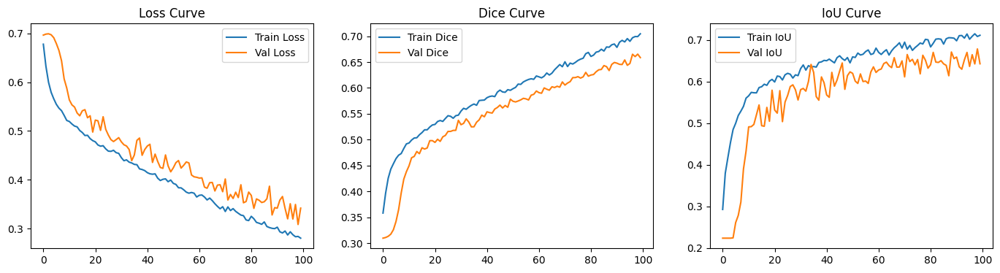

In [19]:
# LOSS + METRICS
# =============================================================
import torch
import torch.nn as nn
import torch.nn.functional as F
from tqdm import tqdm
import copy
import matplotlib.pyplot as plt


# BCE + Dice Loss
class BCEDiceLoss(nn.Module):
    def __init__(self, smooth=1e-5):
        super().__init__()
        self.smooth = smooth
        self.bce = nn.BCELoss()

    def forward(self, preds, targets):
        bce_loss = self.bce(preds, targets)

        preds_f = preds.view(-1)
        targets_f = targets.view(-1)
        inter = (preds_f * targets_f).sum()
        dice_loss = 1 - (2 * inter + self.smooth) / \
                        (preds_f.sum() + targets_f.sum() + self.smooth)

        return 0.5 * bce_loss + 0.5 * dice_loss


# Dice Metric
def dice_coef(y_true, y_pred, smooth=1e-5):
    y_true_f = y_true.view(-1)
    y_pred_f = y_pred.view(-1)
    inter = (y_true_f * y_pred_f).sum()
    return (2. * inter + smooth) / (y_true_f.sum() + y_pred_f.sum() + smooth)


# IoU Metric
def iou_score(preds, masks, threshold=0.5, eps=1e-6):
    preds_bin = (preds > threshold).float()
    masks_bin = (masks > threshold).float()

    inter = (preds_bin * masks_bin).sum().item()
    union = preds_bin.sum().item() + masks_bin.sum().item() - inter

    return inter / (union + eps)


# =============================================================
# TRAINING LOOP
# =============================================================
def train_model(model, train_loader, val_loader, epochs=50):
    device = "cuda" if torch.cuda.is_available() else "cpu"
    model = model.to(device)

    criterion = BCEDiceLoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)

    # Tracking curves
    train_losses, val_losses = [], []
    train_dice_scores, val_dice_scores = [], []
    train_iou_scores, val_iou_scores = [], []

    best_val_loss = float("inf")
    best_epoch = 0
    best_model_weights = None

    for epoch in range(epochs):

        # ------------------ TRAIN ------------------
        model.train()
        train_loss = train_dice = train_iou = 0

        for images, masks in tqdm(train_loader, desc=f"Epoch {epoch+1}/{epochs} [Train]"):
            images, masks = images.to(device), masks.to(device)

            preds = model(images)
            loss = criterion(preds, masks)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            # 🔥 LR Scheduler (Reduce LR on plateau)
            scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
                optimizer,
                mode='min',
                patience=5,
                factor=0.5
            )

            # Accumulate
            train_loss += loss.item()
            train_dice += dice_coef(masks, preds).item()
            train_iou += iou_score(preds, masks)

        # ------------------ VALIDATION ------------------
        model.eval()
        val_loss = val_dice = val_iou = 0

        with torch.no_grad():
            for images, masks in tqdm(val_loader, desc=f"Epoch {epoch+1}/{epochs} [Val]"):
                images, masks = images.to(device), masks.to(device)

                preds = model(images)
                val_loss += criterion(preds, masks).item()
                val_dice += dice_coef(masks, preds).item()
                val_iou += iou_score(preds, masks)

        # ------------------ AVERAGES ------------------
        avg_train_loss = train_loss / len(train_loader)
        avg_val_loss   = val_loss / len(val_loader)
        avg_train_dice = train_dice / len(train_loader)
        avg_val_dice   = val_dice / len(val_loader)
        avg_train_iou  = train_iou / len(train_loader)
        avg_val_iou    = val_iou / len(val_loader)

        train_losses.append(avg_train_loss)
        val_losses.append(avg_val_loss)
        train_dice_scores.append(avg_train_dice)
        val_dice_scores.append(avg_val_dice)
        train_iou_scores.append(avg_train_iou)
        val_iou_scores.append(avg_val_iou)

        # 🔥 STEP LR SCHEDULER
        scheduler.step(avg_val_loss)

        # 🔥 GET CURRENT LR
        current_lr = optimizer.param_groups[0]['lr']

        # ------------------ PRINT ------------------
        print(f"\nEpoch {epoch+1}/{epochs}")
        print(f"LR: {current_lr:.6f}")
        print(f"Train Loss: {avg_train_loss:.4f} | Val Loss: {avg_val_loss:.4f}")
        print(f"Train Dice: {avg_train_dice:.4f} | Val Dice: {avg_val_dice:.4f}")
        print(f"Train IoU : {avg_train_iou:.4f} | Val IoU : {avg_val_iou:.4f}")

        # ------------------ SAVE BEST ------------------
        if avg_val_loss < best_val_loss:
            best_val_loss = avg_val_loss
            best_epoch = epoch + 1
            best_model_weights = copy.deepcopy(model.state_dict())
            torch.save(model.state_dict(), "best_unet_monu.pth")
            print(f"✅ Best model saved (Epoch {epoch+1}, Val Loss {best_val_loss:.4f})")

    # ------------------ LOAD BEST MODEL ------------------
    model.load_state_dict(best_model_weights)

    print("\n🎉 Training Completed!")
    print(f"🏆 Best Epoch: {best_epoch}")
    print(f"✔ Best Val Loss: {best_val_loss:.4f}")

    return {
        "train_losses": train_losses,
        "val_losses": val_losses,
        "train_dice": train_dice_scores,
        "val_dice": val_dice_scores,
        "train_iou": train_iou_scores,
        "val_iou": val_iou_scores,
    }


# =============================================================
# PLOTTING FUNCTION
# =============================================================
def plot_training(history):
    plt.figure(figsize=(17, 4))

    # Loss
    plt.subplot(1, 3, 1)
    plt.plot(history["train_losses"], label="Train Loss")
    plt.plot(history["val_losses"], label="Val Loss")
    plt.title("Loss Curve")
    plt.legend()

    # Dice
    plt.subplot(1, 3, 2)
    plt.plot(history["train_dice"], label="Train Dice")
    plt.plot(history["val_dice"], label="Val Dice")
    plt.title("Dice Curve")
    plt.legend()

    # IoU
    plt.subplot(1, 3, 3)
    plt.plot(history["train_iou"], label="Train IoU")
    plt.plot(history["val_iou"], label="Val IoU")
    plt.title("IoU Curve")
    plt.legend()

    plt.show()

model = UNetSegmentation().to(device)
history = train_model(model, train_loader, val_loader, epochs=100)
plot_training(history)

In [20]:
# =============================================================
# 🔥 FULL TEST EVALUATION (ALL METRICS)
# =============================================================

import torch
import numpy as np
from tqdm import tqdm
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# =============================================================
# BASIC METRICS
# =============================================================

def dice_coef(y_true, y_pred, smooth=1e-5):
    y_true_f = y_true.view(-1)
    y_pred_f = y_pred.view(-1)
    intersection = (y_true_f * y_pred_f).sum()
    return (2. * intersection + smooth) / (y_true_f.sum() + y_pred_f.sum() + smooth)

def iou_coef(y_true, y_pred, smooth=1e-5):
    y_true_f = y_true.view(-1)
    y_pred_f = y_pred.view(-1)
    intersection = (y_true_f * y_pred_f).sum()
    union = y_true_f.sum() + y_pred_f.sum() - intersection
    return (intersection + smooth) / (union + smooth)

# =============================================================
# 🔥 ADVANCED INSTANCE METRICS (PQ, DQ, SQ, AJI)
# =============================================================

def compute_pq(true, pred):
    """
    Simplified PQ computation (binary)
    """
    true = true.astype(np.uint8)
    pred = pred.astype(np.uint8)

    TP = np.sum((true == 1) & (pred == 1))
    FP = np.sum((true == 0) & (pred == 1))
    FN = np.sum((true == 1) & (pred == 0))

    if TP == 0:
        return 0, 0, 0

    dq = TP / (TP + 0.5 * FP + 0.5 * FN)
    sq = TP / (TP + FP + FN)
    pq = dq * sq

    return pq, dq, sq


def compute_aji(true, pred):
    """
    Simplified AJI (binary version)
    """
    true = true.astype(np.uint8)
    pred = pred.astype(np.uint8)

    intersection = np.sum((true == 1) & (pred == 1))
    union = np.sum((true == 1) | (pred == 1))

    if union == 0:
        return 1.0

    return intersection / union

# =============================================================
# LOAD MODEL
# =============================================================

print("📥 Loading best model...")
model.load_state_dict(torch.load("best_unet_monu.pth", map_location=device))
model.eval()

# =============================================================
# ACCUMULATORS
# =============================================================

dice_total, iou_total = 0, 0
acc_total, prec_total, rec_total, f1_total = 0, 0, 0, 0
pq_total, dq_total, sq_total, aji_total = 0, 0, 0, 0

print("🧪 Evaluating on test set...")

# =============================================================
# TEST LOOP
# =============================================================

with torch.no_grad():
    for images, masks in tqdm(test_loader, desc="Evaluating Test Set"):

        images, masks = images.to(device), masks.to(device)
        preds = model(images)
        preds_bin = (preds > 0.5).float()

        # Dice & IoU
        dice_total += dice_coef(masks, preds_bin).item()
        iou_total += iou_coef(masks, preds_bin).item()

        # Flatten for sklearn metrics
        y_true = masks.cpu().numpy().flatten()
        y_pred = preds_bin.cpu().numpy().flatten()

        acc_total += accuracy_score(y_true, y_pred)
        prec_total += precision_score(y_true, y_pred, zero_division=0)
        rec_total += recall_score(y_true, y_pred, zero_division=0)
        f1_total += f1_score(y_true, y_pred, zero_division=0)

        # Instance metrics
        pred_np = preds_bin.cpu().numpy()
        true_np = masks.cpu().numpy()

        for i in range(pred_np.shape[0]):
            pq, dq, sq = compute_pq(true_np[i, 0], pred_np[i, 0])
            aji = compute_aji(true_np[i, 0], pred_np[i, 0])

            pq_total += pq
            dq_total += dq
            sq_total += sq
            aji_total += aji

# =============================================================
# FINAL RESULTS
# =============================================================

num_batches = len(test_loader)
num_samples = len(test_dataset)

print("\n" + "="*50)
print("🎯 FULL TEST SET EVALUATION")
print("="*50)

print(f"✅ Dice:       {dice_total/num_batches:.4f}")
print(f"✅ IoU:        {iou_total/num_batches:.4f}")

print(f"✅ Accuracy:   {acc_total/num_batches:.4f}")
print(f"✅ Precision:  {prec_total/num_batches:.4f}")
print(f"✅ Recall:     {rec_total/num_batches:.4f}")
print(f"✅ F1 Score:   {f1_total/num_batches:.4f}")

print(f"✅ PQ:         {pq_total/num_samples:.4f}")
print(f"✅ DQ:         {dq_total/num_samples:.4f}")
print(f"✅ SQ:         {sq_total/num_samples:.4f}")
print(f"✅ AJI:        {aji_total/num_samples:.4f}")

print("="*50)

📥 Loading best model...
🧪 Evaluating on test set...


Evaluating Test Set: 100%|██████████| 4/4 [00:01<00:00,  2.26it/s]


🎯 FULL TEST SET EVALUATION
✅ Dice:       0.8083
✅ IoU:        0.6789
✅ Accuracy:   0.9193
✅ Precision:  0.7643
✅ Recall:     0.8592
✅ F1 Score:   0.8083
✅ PQ:         0.5410
✅ DQ:         0.8033
✅ SQ:         0.6722
✅ AJI:        0.6722


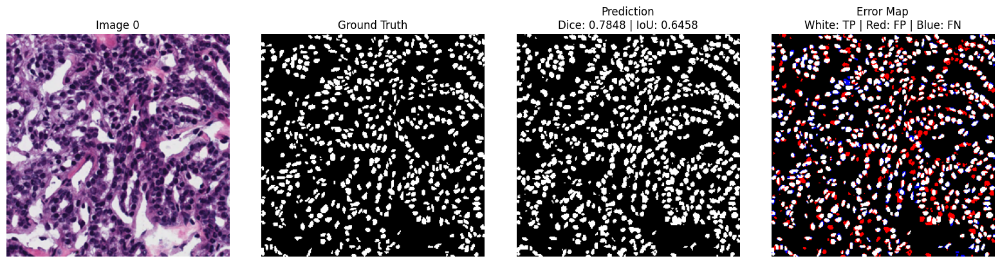

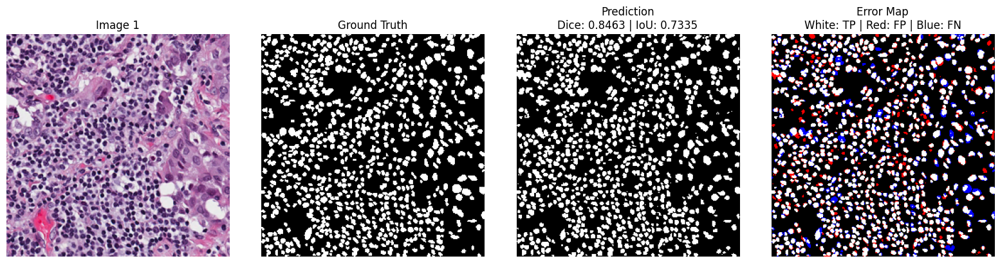

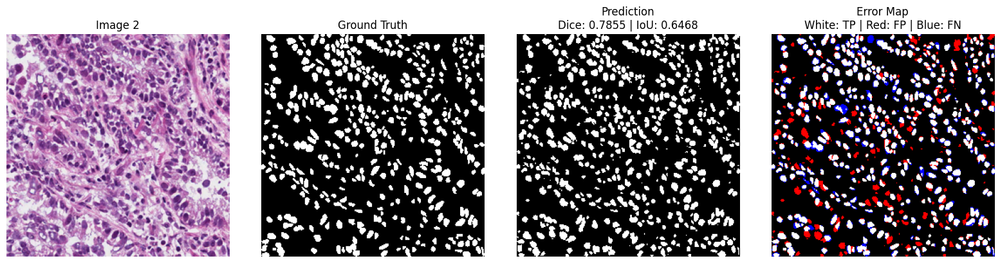

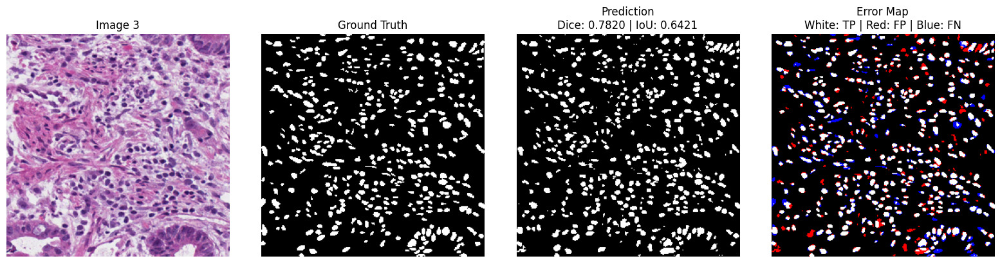

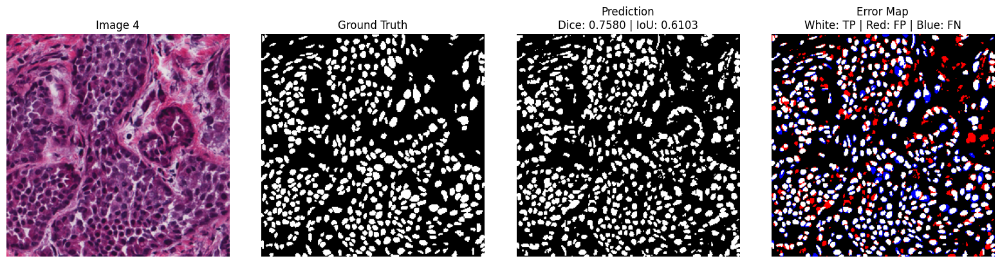

...

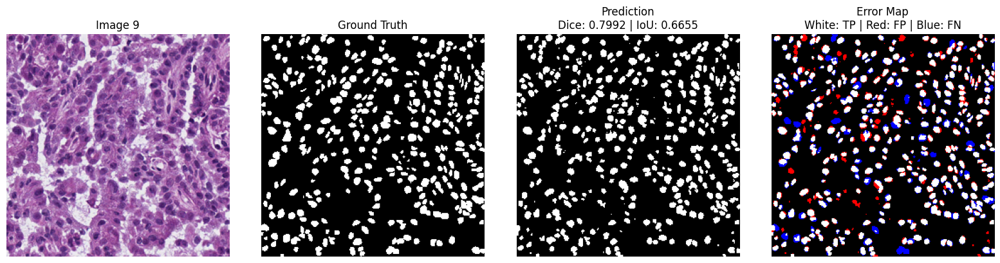

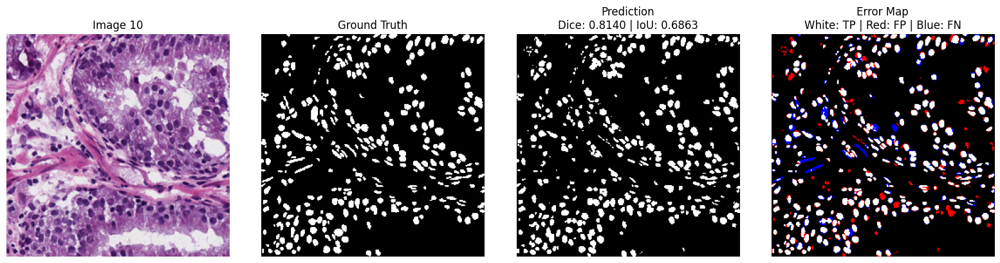

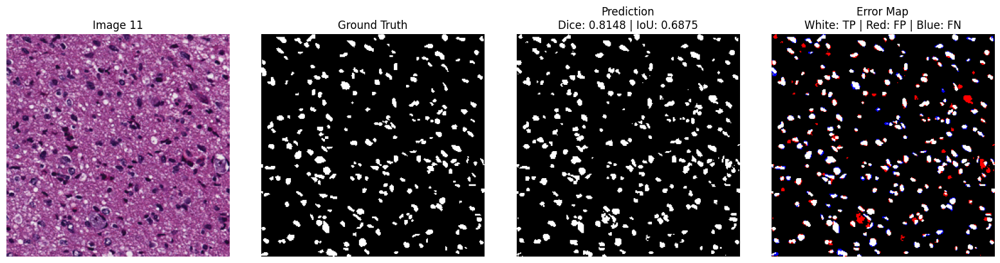

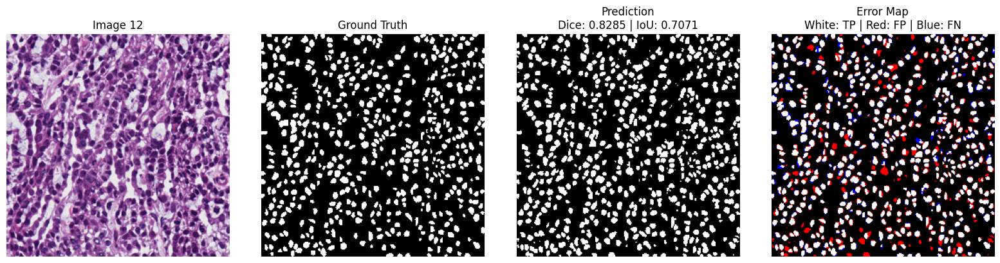

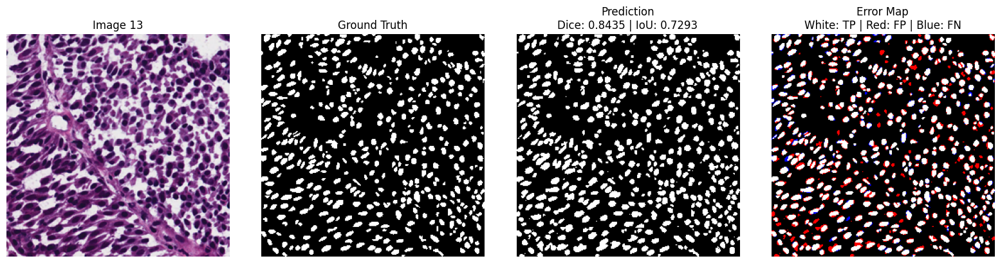

In [21]:
# =============================================================
# 🔥 FINAL VISUALIZATION (FIXED + METRICS + ERROR MAP)
# =============================================================

import torch
import numpy as np
import matplotlib.pyplot as plt

# -------------------------------------------------------------
# Metrics
# -------------------------------------------------------------
def dice_coef_single(y_true, y_pred, smooth=1e-5):
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection + smooth) / (np.sum(y_true) + np.sum(y_pred) + smooth)

def iou_coef_single(y_true, y_pred, smooth=1e-5):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return intersection / (union + smooth)

# -------------------------------------------------------------
# Visualization Function
# -------------------------------------------------------------
def visualize_all_test(model, dataset, threshold=0.5):

    model.eval()

    for idx in range(len(dataset)):

        image, mask = dataset[idx]

        with torch.no_grad():
            pred = model(image.unsqueeze(0).to(device))

            # 🔥 AUTO-FIX: apply sigmoid ONLY if needed
            if pred.min() < 0 or pred.max() > 1:
                pred = torch.sigmoid(pred)

            pred = pred.cpu().squeeze().numpy()

        pred_mask = (pred > threshold).astype(np.uint8)
        true_mask = mask.squeeze().numpy().astype(np.uint8)

        # -----------------------------
        # Metrics
        # -----------------------------
        dice = dice_coef_single(true_mask, pred_mask)
        iou = iou_coef_single(true_mask, pred_mask)

        # -----------------------------
        # Error Map
        # -----------------------------
        error_map = np.zeros((*true_mask.shape, 3), dtype=np.uint8)

        tp = (true_mask == 1) & (pred_mask == 1)
        fp = (true_mask == 0) & (pred_mask == 1)
        fn = (true_mask == 1) & (pred_mask == 0)

        error_map[tp] = [255, 255, 255]  # White
        error_map[fp] = [255, 0, 0]      # Red
        error_map[fn] = [0, 0, 255]      # Blue

        # -----------------------------
        # Plot
        # -----------------------------
        plt.figure(figsize=(16,4))

        # Input Image
        plt.subplot(1,4,1)
        if image.shape[0] == 3:
            plt.imshow(image.permute(1,2,0))
        else:
            plt.imshow(image.squeeze(), cmap='gray')
        plt.title(f"Image {idx}")
        plt.axis("off")

        # Ground Truth
        plt.subplot(1,4,2)
        plt.imshow(true_mask, cmap='gray')
        plt.title("Ground Truth")
        plt.axis("off")

        # Prediction
        plt.subplot(1,4,3)
        plt.imshow(pred_mask, cmap='gray')
        plt.title(f"Prediction\nDice: {dice:.4f} | IoU: {iou:.4f}")
        plt.axis("off")

        # Error Map
        plt.subplot(1,4,4)
        plt.imshow(error_map)
        plt.title("Error Map\nWhite: TP | Red: FP | Blue: FN")
        plt.axis("off")

        plt.tight_layout()
        plt.show()


# =============================================================
# RUN
# =============================================================
visualize_all_test(model, test_dataset)

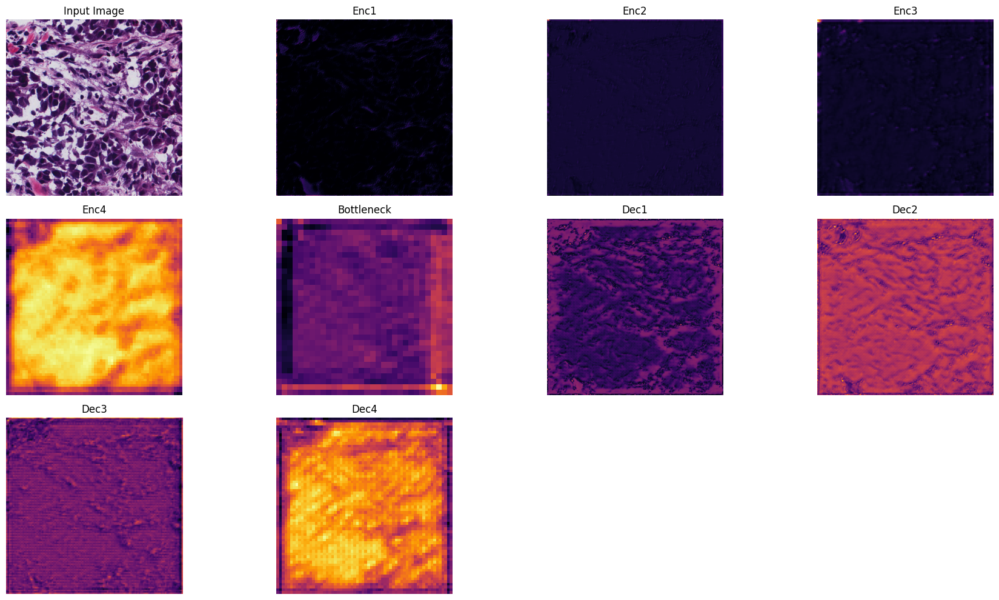

In [22]:
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
from PIL import Image
from torchvision import transforms

# Step 1: Load the model
model.load_state_dict(torch.load('best_unet_monu.pth'))
model.eval()

# Step 2: Load and preprocess the input image
def load_image(image_path):
    image = Image.open(image_path).convert("RGB")

    preprocess = transforms.Compose([
        transforms.Resize((512, 512)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                             std=[0.229, 0.224, 0.225]),
    ])

    image_tensor = preprocess(image)
    image_tensor = image_tensor.unsqueeze(0)
    return image, image_tensor

input_image_path = '/kaggle/input/datasets/maitygouranga/brest-cancer-datasets/monuseg/Brest cancer/MonuSeg/MonuSeg/Test/Images/TCGA-AO-A0J2-01A-01-BSA.png'
original_image, input_tensor = load_image(input_image_path)
input_tensor = input_tensor.to('cuda')

# Define all target layers
# target_layers = {
#     "Enc1": model.enc1,
#     # "Enc2": model.enc2,
#     # "Enc3": model.enc3,
#     # "Enc4": model.enc4,
#     "Bottleneck": model.bottleneck,
#     "Dec1": model.dec1,
#     # "Dec2": model.dec2,
#     # "Dec3": model.dec3,
#     # "Dec4": model.dec4,
# }

# Define all target layers
target_layers = {
    "Enc1": model.e1,
    "Enc2": model.e2,
    "Enc3": model.e3,
    "Enc4": model.e4,
    "Bottleneck": model.bottleneck,
    "Dec1": model.d1,
    "Dec2": model.d2,
    "Dec3": model.d3,
    "Dec4": model.d4,
}

# Plot setup
plt.figure(figsize=(18, 10))

# Show input image
plt.subplot(3, 4, 1)
plt.imshow(original_image.resize((512, 512)))
plt.title("Input Image")
plt.axis('off')

plot_index = 2

# Loop through all layers
for layer_name, target_layer in target_layers.items():

    activation = []

    def get_activation(layer):
        def hook(model, input, output):
            activation.append(output)
        return hook

    hook = target_layer.register_forward_hook(get_activation(target_layer))

    with torch.no_grad():
        output = model(input_tensor)

    hook.remove()

    activation_map = activation[0]
    activation_map = activation_map.mean(dim=1, keepdim=True)
    activation_map = F.relu(activation_map)

    activation_map = (activation_map - activation_map.min()) / \
                     (activation_map.max() - activation_map.min() + 1e-8)

    activation_map = activation_map.squeeze().cpu().numpy()

    plt.subplot(3, 4, plot_index)
    plt.imshow(activation_map, cmap='inferno')
    plt.title(layer_name)
    plt.axis('off')

    plot_index += 1

plt.tight_layout()
plt.show()